# Computing the distribution of protein with the solution of the chemical master equation for a two state promoter.

(c) 2017 Manuel Razo. This work is licensed under a [Creative Commons Attribution License CC-BY 4.0](https://creativecommons.org/licenses/by/4.0/). All code contained herein is licensed under an [MIT license](https://opensource.org/licenses/MIT). 

In [1]:
import glob
# Our numerical workhorses
import numpy as np
import scipy.optimize
import scipy.special
import scipy.integrate
from sympy import mpmath
import pandas as pd
# Import libraries to parallelize processes
from joblib import Parallel, delayed

# Import matplotlib stuff for plotting
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib as mpl

# Seaborn, useful for graphics
import seaborn as sns

# Import the utils for this project
import chann_cap_utils as chann_cap

# Set PBoC plotting style
chann_cap.set_plotting_style()

# Magic function to make matplotlib inline; other style specs must come AFTER
%matplotlib inline

# This enables SVG graphics inline (only use with static plots (non-Bokeh))
%config InlineBackend.figure_format = 'svg'

figdir = '../../fig/chemical_master_analytic_protein/'
tmpdir = '../../tmp/'

#  Analytical solution of the chemical master equation for the two-state promoter protein distribution

[Shahrezaei and Swain](http://www.pnas.org/content/105/45/17256.short) go into the amazing task of deriving the analytical distribution of the protein copy number for a two-state promoter. To define the distribution let's write the possible reactions that can happen.
\begin{align}
\begin{array}{cc}
\text{reaction} & \text{rate}\\
\text{active} \rightarrow \text{inactive} & k_{off}\\
\text{inactive} \rightarrow \text{active} & k_{on}\\
m \rightarrow m+1 & r_m\\
m \rightarrow m-1 & m \cdot \gamma_m\\
p \rightarrow p+1 & r_p\\
p \rightarrow p-1 & p \cdot \gamma_p\\
\end{array}
\end{align}

Having defined all the possible reactions we can now list a series of definitions that will simplify writing down the distribution.
\begin{align}
a &\equiv \frac{r_m}{\gamma_p}\\
b &\equiv \frac{r_p}{\gamma_m}\\
\gamma &\equiv \frac{\gamma_m}{\gamma_p}\\
K_{on} &\equiv \frac{k_{on}}{\gamma_p}\\
K_{off} &\equiv \frac{k_{off}}{\gamma_p}\\
\end{align}
and
\begin{align}
\alpha &\equiv \frac{1}{2}(a + K_{on} + K_{off} + \phi)\\
\beta &\equiv \frac{1}{2}(a + K_{on} + K_{off} - \phi)\\
\end{align}
 with
 \begin{equation}
\phi ^2 = \left( a + K_{on} + K_{off} \right)^2 - 4 a K_{on}
 \end{equation}

Using all these definitions we can finally write down the steady state distribution of protein $P_{st}(p)$
\begin{align}
P_{st}(p) = &\frac{\Gamma (\alpha + p) \Gamma (\beta + p) \Gamma (K_{on} + K_{off})}{\Gamma (p + 1) \Gamma (\alpha) \Gamma (\beta) \Gamma (K_{on} + K_{off} + p)} \times \\
&\left( \frac{b}{1 + b} \right)^p \left( 1 - \frac{b}{1 + b} \right)^\alpha \times\\
& F^2_1 \left( \alpha + p, K_{on} + K_{off} - \beta, K_{on} + K_{off} + p; \frac{b}{1 + b} \right),
\end{align}
where $F^2_1$ is the [Gauss Hypergeometric function](http://mathworld.wolfram.com/HypergeometricFunction.html).

The mean of this distribution is given by
\begin{equation}
\left\langle p \right\rangle = \frac{\frac{r_m}{\gamma_m}\frac{r_p}{\gamma_p} k_{on}}{k_{on} + k_{off}}.
\end{equation}

As before it is better to work with the log of the distribution, therefore taking the log of that monster gives
\begin{align}
\ln P_{st}(p) = &\ln \Gamma (\alpha + p) + ln \Gamma (\beta + p) + \ln \Gamma (K_{on} + K_{off}) \\
&- \ln \Gamma (p + 1) - \ln \Gamma (\alpha) - \ln \Gamma (\beta) - \ln \Gamma (K_{on} + K_{off} + p)\\
&+ p\left[ \ln b - \ln(1 - b)\right] + \alpha \ln \left( 1 - \frac{b}{1 + b} \right)\\
&+ \ln F^2_1 \left( \alpha + p, K_{on} + K_{off} - \beta, K_{on} + K_{off} + p; \frac{b}{1 + b} \right),
\end{align}

# Testing the distribution with the parameters given in the paper.

In order to get the function working I first reproduced the plot from the paper using the parameters that they reported in Figure 3.

In [3]:
# define a np.frompyfunc that allows us to evaluate the sympy.mp.math.hyp1f1
np_log_gauss_hyp = np.frompyfunc(lambda a, b, c, z: \
mpmath.ln(mpmath.hyp2f1(a, b, c, z,  maxprec=10000)).real, 4, 1)

def log_p_p_test(protein):
    '''
    Computes the log conditional probability lnP(p) using the paremeters from
    the Shahrezaei & Swain paper.
    '''
    # define the variables needed for the distribution
    a = 4
    b = 10
    gamma_p = 0.0005
    kon = 0.6 * gamma_p
    koff = 0.2 * gamma_p
    gamma_m = 10 * gamma_p
    gamma = gamma_m / gamma_p
    Kon = kon / gamma_p
    Koff = koff / gamma_p
    
    phi = np.sqrt((a + Kon + Koff)**2 - 4 * a * Kon)
    
    alpha = 1 / 2 * (a + Kon + Koff + phi)
    beta = 1 / 2 * (a + Kon + Koff - phi)
    
    # Compute the probability
    lnp = - scipy.special.gammaln(alpha + protein) \
    - scipy.special.gammaln(beta + protein) \
    - scipy.special.gammaln(Kon + Koff) \
    + scipy.special.gammaln(protein + 1) \
    + scipy.special.gammaln(alpha) \
    + scipy.special.gammaln(beta) \
    + scipy.special.gammaln(Kon + Koff + protein) \
    - protein * np.log(b) \
    + (alpha + protein) * np.log(1 + b)\
    - np_log_gauss_hyp(alpha + protein, Kon + Koff - beta,
          Kon + Koff + protein, b / (1 + b))
    return lnp.astype(np.float)

The probability adds up to 0.999806


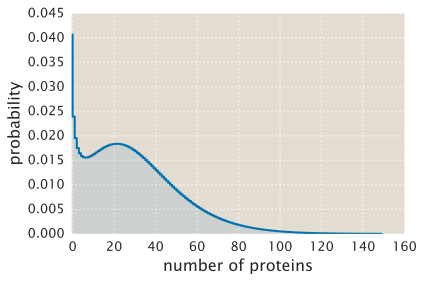

In [6]:
# Define the range of m on which evaluate the function
p_grid = np.arange(0,150)

# Compute the conditional probability for ech repressor copy number
p_pC_mat = np.exp(-log_p_p_test(p_grid))

plt.plot(p_grid, p_pC_mat,
         drawstyle='steps')
plt.fill_between(p_grid, p_pC_mat, alpha=0.1, step='pre')
plt.xlabel('number of proteins')
plt.ylabel('probability')
plt.xlim(left=-0.5)
plt.tight_layout()
plt.savefig(figdir + 'shahrezaei_swain_PNAS_test.pdf', bbox_inches='tight')

print('The probability adds up to {:f}'.format(np.sum(p_pC_mat)))

This figure looks exactly as Fig. 3D from the PNAS paper.

## Including the effect of the inducer.

Just as with the mRNA distribution, the effect of the inducer in the regulation is capture in the $k_{off}$ parameter.
Therefore we compute the conditional probability
\begin{equation}
 P(p \mid C, R) = P \left(p \mid k_{off} = k_0 \cdot R \cdot p_{act}(C)\right)
\end{equation}

So let's define a python function to compute this beast!

In [2]:
# define a np.frompyfunc that allows us to evaluate the sympy.mp.math.hyp1f1
np_log_gauss_hyp = np.frompyfunc(lambda a, b, c, z: \
mpmath.ln(mpmath.hyp2f1(a, b, c, z,  maxprec=10000)).real, 4, 1)

def log_p_p_mid_C(C, protein, rep, ka, ki, epsilon, kon, k0, gamma_m, r_gamma_m,
                  gamma_p, r_gamma_p, logC=False):
    '''
    Computes the log conditional probability lnP(p|C,R), 
    i.e. the probability of having p proteins given 
    an inducer concentration C and a repressor copy number R.
    
    Parameters
    ----------
    C : array-like.
        Concentration at which evaluate the probability.
    protein : array-like.
        protein copy number at which evaluate the probability.        
    rep : float.
        repressor copy number per cell.
    ki, ka : float.
        dissociation constants for the inactive and active states respectively
        in the MWC model of the lac repressor.
    epsilon : float.
        energetic barrier between the inactive and the active state.
    kon : float.
        rate of activation of the promoter in the chemical master equation
    k0 : float.
        diffusion limited rate of a repressor binding the promoter
    gamma_m : float.
        half-life time for the mRNA.
    r_gamma_m : float.
        average number of mRNA in the unregulated promoter.
    gamma_p : float.
        half-life time for the protein.
    r_gamma_p : float.
        average number of protein per mRNA in the unregulated promoter.
    logC : Bool.
        boolean indicating if the concentration is given in log scale. If True
        C = 10**C
    Returns
    -------
    log probability lnP(p|c,R)
    '''
    # Convert C and mRNA into np.arrays
    C = np.array(C)
    protein = np.array(protein)
    # Convert from log if necessary
    if logC:
        C = 10**C
 
    # Calculate the off rate including the MWC model
    koff = k0 * rep * chann_cap.p_act(C, ka, ki, epsilon)

    # compute the variables needed for the distribution
    a = r_gamma_m * gamma_m / gamma_p # r_m / gamma_p
    b = r_gamma_p * gamma_p / gamma_m # r_p / gamma_m
    gamma = gamma_m / gamma_p
    Kon = kon / gamma_p
    Koff = koff / gamma_p
    
    phi = np.sqrt((a + Kon + Koff)**2 - 4 * a * Kon)
    
    alpha = 1 / 2 * (a + Kon + Koff + phi)
    beta = 1 / 2 * (a + Kon + Koff - phi)
    
    # Compute the probability
    lnp = scipy.special.gammaln(alpha + protein) \
    + scipy.special.gammaln(beta + protein) \
    + scipy.special.gammaln(Kon + Koff) \
    - scipy.special.gammaln(protein + 1) \
    - scipy.special.gammaln(alpha) \
    - scipy.special.gammaln(beta) \
    - scipy.special.gammaln(Kon + Koff + protein) \
    + protein * (np.log(b) - np.log(1 + b)) \
    + alpha * np.log(1 - b / (1 + b)) \
    + np_log_gauss_hyp(alpha + protein, Kon + Koff - beta,
            Kon + Koff + protein, b / (1 + b))
    return lnp.astype(float)

# Testing the function with my set of parameters and varying number of repressors

In [8]:
# Specify some parameters
k0 = 2.7E-3
prot_params = dict(ka=0.21, ki=0.00087, epsilon=4.5,
                   kon=chann_cap.kon_fn(-9.7, k0),
                   k0=k0,
                   gamma_m=0.00284, r_gamma_m=15.7,
                   gamma_p=0.000277, r_gamma_p=100)

# Define the range of m on which evaluate the function
p_grid = np.arange(0,2000)

# Define the repressor copy number for which evaluate the function
R_array = np.array([0, 10, 50, 100, 500, 1000])

# Compute the conditional probability for ech repressor copy number
p_mC_mat = np.empty([len(R_array), len(p_grid)])
for i, r in enumerate(R_array):
    p_mC_mat[i, :] = np.exp(log_p_p_mid_C(C=0, protein=p_grid, 
                                          rep=r * 1.66, **prot_params))

/Users/razo/anaconda/lib/python3.5/site-packages/matplotlib/axes/_axes.py:519: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


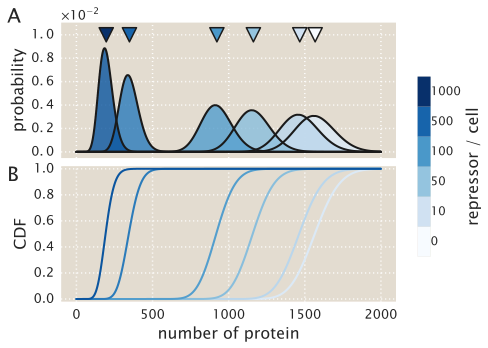

In [9]:
# Define colors
colors = sns.color_palette('Blues', n_colors=len(R_array))

# Initialize figure
fig, ax = plt.subplots(2, 1, figsize=(6,5), sharex=True)
ax[0].yaxis.set_major_formatter(mpl.ticker.ScalarFormatter(\
                             useMathText=True, 
                             useOffset=False))

# Loop through number of repressors
for i, R in enumerate(R_array):
    # PMF plot
    ax[0].plot(p_grid, p_mC_mat[i, :],
             label=r'${0:d}$'.format(R * 2), drawstyle='steps',
              color='k')
    ax[0].fill_between(p_grid, p_mC_mat[i, :], color=colors[i], alpha=0.8,
                      step='pre')
    # CDF plot
    ax[1].plot(p_grid, np.cumsum(p_mC_mat[i, :]), drawstyle='steps',
              color=colors[i], linewidth=2)

ax[0].set_ylabel('probability')
ax[0].margins(0.02)
ax[0].ticklabel_format(style='sci', axis='y', scilimits=(0,0))

ax[1].legend(loc=0)
ax[1].set_xlabel('number of protein')
ax[1].set_ylabel('CDF')
ax[1].margins(0.02)

# Declare color map for legend
cmap = plt.cm.get_cmap('Blues', len(R_array))
bounds = np.linspace(0, len(R_array), len(R_array) + 1)

# Plot a little triangle indicating the mean of each distribution
mean_p = [np.sum(p_grid * prob) for prob in p_mC_mat]

mean_plot = ax[0].scatter(mean_p, [1E-2] * len(mean_p), marker='v', s=200,
            c=np.arange(len(mean_p)), cmap=cmap,
            edgecolor='k',
            linewidth=1.5)

# Generate a colorbar with the concentrations
cbar_ax = fig.add_axes([0.95, 0.25, 0.03, 0.5])
cbar = fig.colorbar(mean_plot, cax=cbar_ax)
cbar.ax.get_yaxis().set_ticks([])
for j, r in enumerate(R_array):
    cbar.ax.text(1, j / len(R_array) + 1 / (2 * len(R_array)),
                 r, ha='left', va='center',
                 transform = cbar_ax.transAxes, fontsize=12)
cbar.ax.get_yaxis().labelpad = 35
cbar.set_label(r'repressor / cell')

plt.figtext(0.0, .9, 'A', fontsize=20)
plt.figtext(0.0, .46, 'B', fontsize=20)

plt.subplots_adjust(hspace=0.06)
plt.savefig(figdir + 'protein_dist_O3.pdf', bbox_inches='tight')

The distribution seems to be working!

A very important step for this to work was to not only use `mpmath` hypergeometric function, but also to take the log of this function using `mpmath`'s native log.

Let's now test it for a single repressor copy number with different inducer concentrations.

In [10]:
# Specify some parameters
k0 = 2.7E-3 # From Jones & Brewster

prot_params = dict(ka=141.52, ki=0.56061, epsilon=4.5,
                   kon=chann_cap.kon_fn(-13.9, k0),
                   k0=k0,
                   gamma_m=0.00284, r_gamma_m=15.7,
                   gamma_p=0.000277, r_gamma_p=100,
                   rep=130 * 1.66)

# Define the range of m on which evaluate the function
p_grid = np.arange(0,2000)

# Define concentrations to use (M)
C_array = np.array([0, 0.1, 5, 10, 25, 50, 75, 100, 250, 500, 1000, 5000])

# Compute the conditional probability for ech repressor copy number
p_pC_mat = np.empty([len(C_array), len(p_grid)])
for i, c in enumerate(C_array):
    p_pC_mat[i, :] = np.exp(log_p_p_mid_C(C=c, protein=p_grid, 
                                          **prot_params))

In [12]:
# Define colors
colors = sns.color_palette('Blues_r', n_colors=len(C_array))

# Initialize figure
fig, ax = plt.subplots(2, 1, figsize=(6,5), sharex=True)
ax[0].yaxis.set_major_formatter(mpl.ticker.ScalarFormatter(\
                             useMathText=True, 
                             useOffset=False))

# Loop through number of repressors
for i, c in enumerate(C_array):
    # PMF plot
    ax[0].plot(p_grid, p_pC_mat[i, :],
               drawstyle='steps',
               color='k')
    ax[0].fill_between(p_grid, p_pC_mat[i, :], color=colors[i], alpha=0.8,
                      step='pre')
    # CDF plot
    ax[1].plot(p_grid, np.cumsum(p_pC_mat[i, :]), drawstyle='steps',
              color=colors[i], linewidth=2)

ax[0].set_ylabel('probability')
ax[0].margins(0.02)
ax[0].ticklabel_format(style='sci', axis='y', scilimits=(0,0))
ax[0].set_ylim([0, 7E-3])

ax[1].legend(loc=0)
ax[1].set_xlabel('number of proteins')
ax[1].set_ylabel('CDF')
ax[1].margins(0.02)

# Declare color map for legend
cmap = plt.cm.get_cmap('Blues_r', len(C_array))
bounds = np.linspace(0, len(C_array), len(C_array) + 1)

# Plot a little triangle indicating the mean of each distribution
mean_p = [np.sum(p_grid * prob) for prob in p_pC_mat]

mean_plot = ax[0].scatter(mean_p, [6.5E-3] * len(mean_p), marker='v', s=200,
            c=np.arange(len(mean_p)), cmap=cmap,
            edgecolor='k',
            linewidth=1.5)

# Generate a colorbar with the concentrations
cbar_ax = fig.add_axes([0.95, 0.25, 0.03, 0.5])
cbar = fig.colorbar(mean_plot, cax=cbar_ax)
cbar.ax.get_yaxis().set_ticks([])
for j, c in enumerate(C_array):
    if (c == 0) or (c > 1):
        label=str(int(c))
    else:
        label=str(c)
    cbar.ax.text(1, j / len(C_array) + 1 / (2 * len(C_array)),
                 label, ha='left', va='center',
                 transform = cbar_ax.transAxes, fontsize=12)
cbar.ax.get_yaxis().labelpad = 35
cbar.set_label(r'[inducer] ($\mu$M)')

plt.figtext(0.0, .9, 'A', fontsize=20)
plt.figtext(0.0, .46, 'B', fontsize=20)

plt.subplots_adjust(hspace=0.06)
plt.savefig(figdir + 'protein_dist_O2_RBS1027.pdf', bbox_inches='tight')

/Users/razo/anaconda/lib/python3.5/site-packages/matplotlib/axes/_axes.py:519: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


### Verifying that the fold-change looks similar to the MWC induction project
As a sanity check let's compute the mean expression for each distribution, and then divide it by the mean expression in the absence of inducer to compare this ti the MWC induction project.

In [13]:
# Compute the expected value at 0 repressors per cell
prot_params['rep'] = 0
p_delta = np.exp(log_p_p_mid_C(C=0, protein=p_grid, **prot_params))
mean_delta = np.sum(p_grid * p_delta)
# Compute the expected value
mean_p = [np.sum(p_grid * pdist) for pdist in p_pC_mat]
# Compute the fold change
fold_change = mean_p / mean_delta

# Compute the expected fold change with the parameters
cc = np.logspace(-8, -2, 200)
pact = chann_cap.p_act(C=cc * 1E6, ka=prot_params['ka'], ki=prot_params['ki'], 
                       epsilon=prot_params['epsilon'])
fc = (1 + 130 * 2 * pact / 4.6E6 * np.exp(13.9))**-1

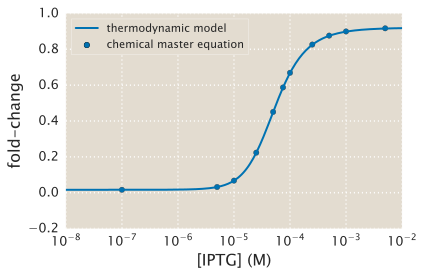

In [14]:
fig, ax = plt.subplots(1, 1)
# Plot the theoretical fold change given these parameters
ax.plot(cc, fc, label='thermodynamic model')

# Plot the one obtained from the distirbution equation
ax.scatter(C_array / 1E6, fold_change, marker='o', s=30,
          label='chemical master equation')

# Format plot
ax.set_xlabel('[IPTG] (M)')
ax.set_ylabel('fold-change')
ax.set_xscale('log')
ax.set_xlim([1E-8, 1E-2])
ax.legend(loc=0)
plt.tight_layout()
plt.savefig(figdir + 'induction_thermo_vs_cm.pdf')

Indeed both theories are in perfect agreement at the mean experssion level.

## Plotting a couple of examples for the channel capacity explanation.
In order to explain the concept of channel capacity I will plot two examples:
1. O3 - RBS1L
2. O3 - HG104

This will help contrast how a high information processing set of parameters differs from a low information processing one.

In [15]:
# Specify some parameters
k0 = 2.7E-3 # From Jones & Brewster
# k0 = 0.0000023
prot_params = dict(ka=141.52, ki=0.56061, epsilon=4.5,
                   kon=chann_cap.kon_fn(-9.7, k0),
                   k0=k0,
                   gamma_m=0.00284, r_gamma_m=15.7,
                   gamma_p=0.000277, r_gamma_p=100)
                   

# Define the range of m on which evaluate the function
p_grid = np.arange(0,2000)
# Define the repressor numbers to use
R_array = [11, 870]
# Define concentrations to use (M)
C_array = np.array([0, 0.1, 5, 10, 25, 50, 75, 100, 250, 500, 1000, 5000])

# Compute the conditional probability for ech repressor copy number
p_pC_HG104 = np.empty([len(C_array), len(p_grid)])
p_pC_RBS1L = np.empty([len(C_array), len(p_grid)])
for i, c in enumerate(C_array):
    print(c)
    p_pC_HG104[i, :] = np.exp(log_p_p_mid_C(C=c, protein=p_grid, rep=R_array[0],
                                          **prot_params))
    p_pC_RBS1L[i, :] = np.exp(log_p_p_mid_C(C=c, protein=p_grid, rep=R_array[1],
                                          **prot_params))

0.0
0.1
5.0
10.0
25.0
50.0
75.0
100.0
250.0
500.0
1000.0
5000.0


In [16]:
# Define colors
colors = sns.color_palette('Blues_r', n_colors=len(C_array))

# Initialize figure
fig, ax = plt.subplots(1, 1, figsize=(6,4))
ax.yaxis.set_major_formatter(mpl.ticker.ScalarFormatter(\
                             useMathText=True, 
                             useOffset=False))

# Loop through number of repressors
for i, c in enumerate(C_array):
    # PMF plot
    ax.plot(p_grid, p_pC_RBS1L[i, :],
             label=label, drawstyle='steps',
              color='k')
    ax.fill_between(p_grid, p_pC_RBS1L[i, :], color=colors[i], alpha=0.8,
                      step='pre')
    
ax.set_ylabel('probability')
ax.margins(0.02)
ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
ax.set_ylim([0, 7.5E-3])
ax.set_xlabel('number of proteins')

# Declare color map for legend
cmap = plt.cm.get_cmap('Blues_r', len(C_array))
bounds = np.linspace(0, len(C_array), len(C_array) + 1)

# Plot a little triangle indicating the mean of each distribution
mean_p = [np.sum(p_grid * prob) for prob in p_pC_RBS1L]

mean_plot = ax.scatter(mean_p, [7E-3] * len(mean_p), marker='v', s=200,
            c=np.arange(len(mean_p)), cmap=cmap,
            edgecolor='k',
            linewidth=1.5)

# Generate a colorbar with the concentrations
cbar_ax = fig.add_axes([0.95, 0.25, 0.03, 0.5])
cbar = fig.colorbar(mean_plot, cax=cbar_ax)
cbar.ax.get_yaxis().set_ticks([])
for j, c in enumerate(C_array):
    if (c == 0) or (c > 1):
        label=str(int(c))
    else:
        label=str(c)
    cbar.ax.text(1, j / len(C_array) + 1 / (2 * len(C_array)),
                 label, ha='left', va='center',
                 transform = cbar_ax.transAxes, fontsize=12)
cbar.ax.get_yaxis().labelpad = 35
cbar.set_label(r'[inducer] ($\mu$M)')

plt.savefig(figdir + 'protein_dist_O3_RBS1L.pdf', bbox_inches='tight')

In [17]:
# Define colors
colors = sns.color_palette('Blues_r', n_colors=len(C_array))

# Initialize figure
fig, ax = plt.subplots(1, 1, figsize=(6,4))
ax.yaxis.set_major_formatter(mpl.ticker.ScalarFormatter(\
                             useMathText=True, 
                             useOffset=False))

# Loop through number of repressors
for i, c in enumerate(C_array):
    # PMF plot
    ax.plot(p_grid, p_pC_HG104[i, :],
             label=label, drawstyle='steps',
              color='k')
    ax.fill_between(p_grid, p_pC_HG104[i, :], color=colors[i], alpha=0.8,
                      step='pre')
    
ax.set_ylabel('probability')
ax.margins(0.02)
ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
ax.set_ylim([0, 7.5E-3])
ax.set_xlabel('number of proteins')

# Declare color map for legend
cmap = plt.cm.get_cmap('Blues_r', len(C_array))
bounds = np.linspace(0, len(C_array), len(C_array) + 1)

# Plot a little triangle indicating the mean of each distribution
mean_p = [np.sum(p_grid * prob) for prob in p_pC_HG104]

mean_plot = ax.scatter(mean_p, [7E-3] * len(mean_p), marker='v', s=200,
            c=np.arange(len(mean_p)), cmap=cmap,
            edgecolor='k',
            linewidth=1.5)

# Generate a colorbar with the concentrations
cbar_ax = fig.add_axes([0.95, 0.25, 0.03, 0.5])
cbar = fig.colorbar(mean_plot, cax=cbar_ax)
cbar.ax.get_yaxis().set_ticks([])
for j, c in enumerate(C_array):
    if (c == 0) or (c > 1):
        label=str(int(c))
    else:
        label=str(c)
    cbar.ax.text(1, j / len(C_array) + 1 / (2 * len(C_array)),
                 label, ha='left', va='center',
                 transform = cbar_ax.transAxes, fontsize=12)
cbar.ax.get_yaxis().labelpad = 35
cbar.set_label(r'[inducer] ($\mu$M)')

plt.savefig(figdir + 'protein_dist_O3_HG104.pdf', bbox_inches='tight')

# Using interpolations to speed up the evaluation of the function.

The evaluation of the function when we need to compute in the order of $10^3 - 10^4$ bins is **extremely slow**, to the point that it is imposible to perform multiple calculations with different parameter sets.

But despite the fact that the analytical expression is quite complicated to evaluate, the resulting functions are surprisingly smooth. We can take advantage of this and speed up the computation using a clever trick: Instead of evaluating every point in the grid, we can undersample and perform a spline interpolation to fit a function that is much easier to evaluate.

To perform the spline interpolation we will make use of `scipy.interpolate.interp1d`.

In [10]:
def log_p_p_mid_C_spline(C, p_range, step, rep, ka, ki, omega, 
                         kon, k0, gamma_m, r_gamma_m, gamma_p, r_gamma_p,
                         norm_check=False, tol=0.01):
    '''
    Computes the log conditional probability lnP(p|C,R), 
    i.e. the probability of having p proteins given 
    an inducer concentration C and a repressor copy number R.
    This function performs an interpolation with n_points uniformly
    distributed in p_range
    
    Parameters
    ----------
    C : array-like.
        Concentration at which evaluate the probability.
    p_range : array-like.
        Protein copy number range at which evaluate the probability.        
    step : int.
        Step size to take between values in p_range.
    repressor : float.
        Repressor copy number per cell.
    ki, ka : float.
        Dissociation constants for the inactive and active states respectively
        in the MWC model of the lac repressor.
    omega : float.
        Energetic barrier between the inactive and the active state.
    kon : float.
        Rate of activation of the promoter in the chemical master equation
    k0 : float.
        Diffusion limited rate of a repressor binding the promoter
    gamma_m : float.
        Half-life time for the mRNA.
    r_gamma_m : float.
        Average number of mRNA in the unregulated promoter.
    gamma_p : float.
        Half-life time for the protein.
    r_gamma_p : float.
        Average number of protein per mRNA in the unregulated promoter.
    norm_check : bool.
        Check if the returned distribution is normalized, and if not perform
        the full evaluation of the analytical expression.
    tol : float.
        +- Tolerance allowed for the normalization. The distribution is considered
        normalized if it is within 1+-tol
    Returns
    -------
    log probability lnP(p|c,R)
    '''
    # Convert C and the protein range into np.arrays
    C = np.array(C)
    protein = np.arange(p_range[0], p_range[1], step)
    protein = np.append(protein, p_range[1])
    # Compute the probability
    lnp = log_p_p_mid_C(C, protein, rep, ka, ki, omega, 
                        kon, k0, gamma_m, r_gamma_m, gamma_p, r_gamma_p)
    
    # Perform the cubic spline interpolation
    lnp_spline = scipy.interpolate.interp1d(protein, lnp, kind='cubic')
    # return the complete array of proteins evaluated with the spline
    p_array = np.arange(p_range[0], p_range[1])
    
    lnp = lnp_spline(p_array)
    # If ask to check the normalization of the distribution
    if norm_check:
        if (np.sum(np.exp(lnp)) <= 1 + tol) and (np.sum(np.exp(lnp)) >= 1 - tol):
            return lnp
        else:
            print('Did not pass the normalization test. Re-doing calculation')
            protein = np.arange(p_range[0], p_range[1])
            return log_p_p_mid_C(C, protein, rep, ka, ki, omega, 
                        kon, k0, gamma_m, r_gamma_m, gamma_p, r_gamma_p)
    else:
        return lnp

Let's compare both computations using our parameters.

**NOTE**: I used 100 protein/mRNA because the evaluation at 1000 protein/mRNA requires evaluating all the way to 30,000 protein and the computation is too hard.

In [14]:
# Specify some parameters
k0 = 2.7E-3
prot_params = dict(ka=0.21, ki=0.00087, omega=np.exp(-4.5),
                   k0=k0,
                   gamma_m=0.00284, r_gamma_m=15.7,
                   gamma_p=0.000277, r_gamma_p=100)

prot_params['rep'] = 10
prot_params['kon'] = chann_cap.kon_fn(-13.9)

In [15]:
print('Regular computation:')
%timeit log_p_p_mid_C(0, np.arange(0, 3000), **prot_params)

print('Spline approximation:')
%timeit log_p_p_mid_C_spline(0, [0, 3000], 100, **prot_params)

Regular computation:
1 loop, best of 3: 16.9 s per loop
Spline approximation:
1 loop, best of 3: 186 ms per loop


Wow, the spline approximation with this step size speeds up the computation 3 orders of magintude! I'll definitely take them.

But we must make sure that the distribution is still normalized.

In [16]:
np.sum(np.exp(log_p_p_mid_C_spline(0, [0, 3000], 100, **prot_params)))

1.0047441355900995

For this naive example it does seem to be normalize, but let's be more systematic about it.

In [17]:
# Define the concentrations to evaluate
C_array = np.array([0, 50, 500, 5000]) / 1E3

# define the number of repressors on which evaluate the function
R_array = np.array([1, 10, 100, 1000])

p_spline_mat = np.zeros([len(R_array), len(C_array)])
for i, r in enumerate(R_array):
    prot_params['rep'] = r * 1.66
    for j, c in enumerate(C_array):
        p_spline_mat[i, j] = np.sum(np.exp(log_p_p_mid_C_spline(c, 
                             [0, 3000], 100, **prot_params)))

In [18]:
(p_spline_mat > 1.01) | (p_spline_mat < 0.99)

array([[False, False, False, False],
       [ True, False, False, False],
       [ True, False, False, False],
       [ True,  True, False, False]], dtype=bool)

It seems that the approximation breaks at high repressor copy number and low concentration (i.e. at high **active** repressor copy number). Let's try reducing the step size.

In [19]:
# Define the concentrations to evaluate
C_array = np.array([0, 50, 500, 5000]) / 1E3

# define the number of repressors on which evaluate the function
R_array = np.array([1, 10, 100, 1000])

p_spline_mat = np.zeros([len(R_array), len(C_array)])
for i, r in enumerate(R_array):
    prot_params['rep'] = r * 1.66
    for j, c in enumerate(C_array):
        p_spline_mat[i, j] = np.sum(np.exp(log_p_p_mid_C_spline(c, 
                             [0, 3000], 10, **prot_params)))

In [20]:
(p_spline_mat > 1.01) | (p_spline_mat < 0.99)

array([[False, False, False, False],
       [ True, False, False, False],
       [False, False, False, False],
       [ True, False, False, False]], dtype=bool)

Given that this doesn't solve the problem completely for some of the parameters I think is best to evaluate the actual expression when this happens. I added a logical gate to the function after realizing this was an issue. Now if we use it we should not have this problem. Let's check!

In [85]:
# Define the concentrations to evaluate
C_array = np.array([0, 50, 500, 5000]) / 1E3

# define the number of repressors on which evaluate the function
R_array = np.array([1, 10, 100, 1000])

p_spline_mat = np.zeros([len(R_array), len(C_array)])
for i, r in enumerate(R_array):
    prot_params['rep'] = r * 1.66
    for j, c in enumerate(C_array):
        print('rep = {0:d}, C = {1:f}'.format(r, c))
        p_spline_mat[i, j] = np.sum(np.exp(log_p_p_mid_C_spline(c, 
                             [0, 3000], 100, norm_check=True, tol=0.001,
                             **prot_params)))

rep = 1, C = 0.000000
rep = 1, C = 0.050000
rep = 1, C = 0.500000
rep = 1, C = 5.000000
rep = 10, C = 0.000000
Did not pass the normalization test. Re-doing calculation
rep = 10, C = 0.050000
rep = 10, C = 0.500000
rep = 10, C = 5.000000
rep = 100, C = 0.000000
Did not pass the normalization test. Re-doing calculation
rep = 100, C = 0.050000
rep = 100, C = 0.500000
rep = 100, C = 5.000000
rep = 1000, C = 0.000000
Did not pass the normalization test. Re-doing calculation
rep = 1000, C = 0.050000
Did not pass the normalization test. Re-doing calculation
rep = 1000, C = 0.500000
rep = 1000, C = 5.000000


In [86]:
(p_spline_mat > 1.01) | (p_spline_mat < 0.99)

array([[False, False, False, False],
       [ True, False, False, False],
       [False, False, False, False],
       [False, False, False, False]], dtype=bool)

Note that one of the strains after being re-computed still didn't pass the normalization tets. That is a numeric problem that happens at high protein copy number. If one instead of computing the fill range limits itself to for example 1/3 of the full protein dynamic range the normalization is correct.

In [21]:
prot_params['rep'] = 10 * 1.66

print('Full dynamic range normalization : ')
print(np.sum(np.exp(log_p_p_mid_C(0, np.arange(3000), **prot_params))))
print('1/3 dynamic range normalization : ')
print(np.sum(np.exp(log_p_p_mid_C(0, np.arange(1000), **prot_params))))

Full dynamic range normalization : 
1.70821892387e+18
1/3 dynamic range normalization : 
0.999999999976


So it is important to be aware of this issue. 

# Parallel computation of the distribution.

Another alternative to speed up the computation of the distribution is to perform the calculation in blocks and distribute them among different cores. Let's try to implement that idea.

In [17]:
# Specify some parameters
k0 = 2.7E-3
prot_params = dict(ka=0.21, ki=0.00087, omega=np.exp(-4.5),
                   kon=chann_cap.kon_fn(-15.3, k0),
                   k0=k0,
                   gamma_m=0.00284, r_gamma_m=15.7,
                   gamma_p=0.000277, r_gamma_p=100)
prot_params['rep'] = 1000 * 1.66

In [19]:
# Define the mRNA copy numbers to evaluate
prot_grid = np.reshape(np.arange(0, 3000), [-1, 250])


# define a function to run in parallel the computation
def lnp_parallel(r):
    lnp = log_p_p_mid_C(C=0, protein=r, **prot_params)
    return lnp

print('Parallel computation:')
%timeit Parallel(n_jobs=6)(delayed(lnp_parallel)(r) \
                                for r in prot_grid)

print('Regular computation:')
%timeit log_p_p_mid_C(C=0, protein=np.arange(0,3000), **prot_params)

Parallel computation:
1 loop, best of 3: 18.1 s per loop
Regular computation:
1 loop, best of 3: 1min 4s per loop


This indeed speeds up the computation by a factor of $x$, where $x$ is the number of cores used for the computation.

Since when performing the parallel computation the protein ranges are divided into blocks, we can use this fact to get around the numerical issue of having to use smaller ranges to get the distribution to be normalized.

Recall that if we compute this the distribution won't be normalized:

In [22]:
prot_params['rep'] = 10 * 1.66
prot_params['kon'] = chann_cap.kon_fn(-13.9)
prot_grid = np.reshape(np.arange(0, 3000), [-1, 250])
# define a function to run in parallel the computation
def lnp_parallel(r):
    lnp = log_p_p_mid_C(C=0, protein=r, **prot_params)
    return lnp

lnp = Parallel(n_jobs=7)(delayed(lnp_parallel)(r) for r in prot_grid)
print(np.sum(np.exp(lnp)))

1.70821892387e+18


But since the computation was done in blocks we can add blocks until the distribution is normalized, leaving the rest of the entries as zeros.

Let's implement that idea. First we add each individual block, i.e. each row of the `lnp` matrix. Then let's look at the cumulative sum.

In [28]:
p_sum = np.sum(np.exp(lnp), axis=1)
np.cumsum(p_sum)

array([  2.71175606e-01,   9.93353394e-01,   9.99998837e-01,
         1.00000000e+00,   1.00000000e+00,   1.00000000e+00,
         1.00000000e+00,   1.00000000e+00,   1.00000000e+00,
         1.83219726e+00,   1.77319506e+10,   1.70821892e+18])

Seems that by the time we hit `protein=750` the distribution is very very closed to normalized. So in principle we could just take the probability values of these 3 blocks and leave the rest as zero and we would have a normalized distribution.

In [29]:
# Initialize the matrix of zeros where the normalized distribution will live
p_norm = np.zeros_like(lnp)
p = np.exp(lnp)

# Compute the cumulative sum of the protein copy number
p_sum = np.cumsum(np.sum(p, axis=1))

# Find the first block that is already normalized given the tolerance value
norm_idx = np.where((p_sum <= 1 + 1E-9) & (p_sum >= 1 - 1E-9))[0][0]

# add all the probability values of these blocks to our matrix
p_norm[0:norm_idx, :] = p[0:norm_idx, :]

np.sum(p_norm)

0.99999883720421079

# Fitting the $k_{on}$ and $k_{off}$ from experimental data.

As we explained in the mRNA analytical solution when defining the parametres for the equation, if we want to be self consistent between the thermodynamic picture and the chemical master equation framework the **mean** fold-change **at the mRNA level** should satisfy

\begin{equation}
\text{fold-change} = \frac{1}{1 + \frac{k_0 \cdot p_{act} \cdot [R]}{k_{on}}} = \frac{1}{1 + \frac{2R \cdot p_{act}}{N_{NS}} e^{-\beta \Delta \epsilon_r}}
\end{equation}

But actually since the mean protein level is given by

\begin{equation}
\left\langle p \right\rangle = \frac{\frac{r_m}{\gamma_m}\frac{r_p}{\gamma_p} k_{on}}{k_{on} + k_{off}}.
\end{equation}

the terms depending on the production and degradation of protein and mRNA cancel out when computing the fold change and the functional form of the mean fold change ends up being the exact same as for the mRNA level.

This ends up constraining the ratio $k_0 / k_{on}$ such that it is consistent with the energies measured by Hernan as explained before. But there is some doubt about the validity of the $k_0$ value that we quoted from the Elf et. al paper. The main reason is that for the two state model we are explicitly ignoring the empty promter state in order to make analytical progress. That means that the parameter measured by Elf et al. doesn't reflect the reality of this model as it is a rate from the empty to the repressed promoter. What we need for this model is an "effective rate" from the active to the inactive promoter that includes all the processes that happen in between.

An alternative way to obtain these two rates is to use the *single-cell information* that the flow cytometer provides. The difference is that we can not only compute the first moment, but we can make use of the noise in gene expression to obtain these parameters.

In their paper [Shahrezaei and Swain](http://www.pnas.org/content/105/45/17256.short) derive the expression for the noise defined as 

\begin{equation}
\eta \equiv \frac{\sqrt{\left\langle p^2 \right\rangle - \left\langle p \right\rangle^2}}{\left\langle p \right\rangle},
\end{equation}

i.e. the standard deviation over the mean. They claim that the noise should satisfy

\begin{equation}
\eta^2 = \frac{1}{\langle p \rangle} + \frac{\gamma_p}{\gamma_m} \frac{1}{\langle m \rangle} + \frac{\gamma_p}{\gamma_p + k_{on} + k_{off}} \frac{k_{off}}{k_{on}}.
\end{equation}

If we include the assumption that $k_{off} \equiv k_{off}([R])$ and we substitude the definition of mean protein and mean mRNA copy number we find that the noise scales with the number of repressors as

\begin{equation}
\eta^2([R]) = \frac{k_{on} + k_0[R]}{\frac{r_m}{\gamma_m} \frac{r_p}{\gamma_p} k_{on}} + \frac{\gamma_p}{\gamma_m} \frac{k_{on} + k_0[R]}{k_{on} \frac{r_m}{\gamma_m}} + \frac{\gamma_p}{\gamma_p + k_{on} + k_{0}[R]} \frac{k_{0}[R]}{k_{on}}.
\end{equation}

Let's implement a function to compute this noise

In [2]:
def noise_protein(C, rep, ka, ki, epsilon, kon, k0, 
                     gamma_m, r_gamma_m,
                     gamma_p, r_gamma_p):
    '''
    Computes the noise in gene expression as a function of all the parameters
    that go into the chemical master equation.
    
    Parameters
    ----------
    C : array-like.
        Concentration at which evaluate the probability.
    repressor : float.
        repressor copy number per cell.
    ki, ka : float.
        dissociation constants for the inactive and active states respectively
        in the MWC model of the lac repressor.
    omega : float.
        energetic barrier between the inactive and the active state.
    kon : float.
        rate of activation of the promoter in the chemical master equation
    k0 : float.
        diffusion limited rate of a repressor binding the promoter
    gamma_m : float.
        half-life time for the mRNA.
    r_gamma_m : float.
        average number of mRNA in the unregulated promoter.
    gamma_p : float.
        half-life time for the protein.
    r_gamma_p : float.
        average number of protein per mRNA in the unregulated promoter.
    Returns
    -------
    eta the noise in protein distribution
    '''
    # Convert C into np.array
    C = np.array(C)
    # Calculate the off rate including the MWC model
    koff = k0 * rep * chann_cap.p_act(C, ka, ki, epsilon)
    
    # Compute the noise
    mean_m = r_gamma_m * kon / (kon + koff)
    mean_p = r_gamma_m * r_gamma_p * kon / (kon + koff)
    gamma = gamma_m / gamma_p
    return np.sqrt(1 / mean_p + 1 / gamma * 1 / mean_m +\
           gamma_p / (gamma_p + kon + koff) * koff / kon)

Let's compute the noise for different values of $k_0$ changing $k_{off}$ to satisfy the thermodynamic model

In [3]:
# Specify some parameters
k0_array = np.logspace(-8, -3, 200)
repressors = [11, 30, 62, 130, 610, 870]
binding_energy = -15.3
prot_params = dict(ka=0.199, ki=0.00064, epsilon=4.5,
                   gamma_m=0.00284, r_gamma_m=15.7,
                   gamma_p=0.000277, r_gamma_p=100)

# Compute noise as a function the diffusion limited value and repressor number
noise_array = np.empty([len(k0_array), len(repressors)])
for i, k0 in enumerate(k0_array):
    for j, rep in enumerate(repressors):
    # Repressor copy number of my favorite strain RBS1027
        prot_params['rep'] = rep * 1.66
        prot_params['k0'] = k0
        prot_params['kon'] = chann_cap.kon_fn(binding_energy, k0)
        noise_array[i, j] = noise_protein(0, **prot_params)

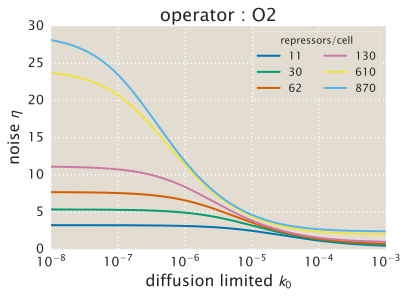

In [4]:
fig = plt.figure()
for j, r in enumerate(repressors):
    plt.plot(k0_array, noise_array[:, j],
            label=str(r))
plt.xscale('log')
plt.xlabel('diffusion limited $k_0$')
plt.ylabel(r'noise $\eta$')
plt.title('operator : O2')
plt.legend(loc=0, ncol=2, title='repressors/cell')

So indeed this diffusion limited has a clear effect on the noise in gene expression.

The idea is to obtain a value for $k_0$ and $k_{on}$ based on the experimental microscopy data.

For this exercise we will use the microscopy data generated  for the  MWC induction project.

In [5]:
# Read the tidy-data frame
files = glob.glob('../../data/csv_microscopy/mwc_data/*csv')
df_micro = pd.concat(pd.read_csv(f, comment='#') for f in files if 'Oid' not in f)
df_micro.head()

,date,username,operator,binding_energy,rbs,repressors,IPTG_uM,area,eccentricity,solidity,mean_intensity
0,20161018,gchure,O2,-13.9,auto,0,0.0,2.5344,0.836521,0.942857,134.154620
1,20161018,gchure,O2,-13.9,auto,0,0.0,2.7136,0.882338,0.921739,118.181348
2,20161018,gchure,O2,-13.9,auto,0,0.0,4.3776,0.946937,0.872449,120.647971
3,20161018,gchure,O2,-13.9,auto,0,0.0,5.6320,0.831335,0.956522,122.134728
4,20161018,gchure,O2,-13.9,auto,0,0.0,2.8416,0.878814,0.948718,113.355678


Having read the data let's compute the average noise for the different concentrations. Consider that the noise is defined as
\begin{equation}
\eta \equiv \frac{\sqrt{\left\langle p^2 \right\rangle - \left\langle p \right\rangle^2}}{\left\langle p \right\rangle},
\end{equation}

This means that since the mean protein copy number $\left\langle p \right\rangle$ is involved we need to take into account the **autofluorescence**. So to compute this quantity from the fluroescence measurements we need to compute
\begin{equation}
\eta = \frac{\sqrt{\left\langle (I  - \langle I_{\text{auto}}\rangle)^2 \right\rangle - \left\langle (I  - \langle I_{\text{auto}}\rangle) \right\rangle^2}}{\left\langle (I  - \langle I_{\text{auto}}\rangle) \right\rangle},
\end{equation}
where $I$ is the intensity of the objective strain and $\langle I_{\text{auto}}\rangle$ is the mean utofluorescence intensity.

In [6]:
# group by date and by IPTG concentration
df_group = df_micro.groupby(['date', 'IPTG_uM'])

# Initialize data frame to save the noise
df_noise = pd.DataFrame(columns=['date', 'IPTG_uM','operator', 'rbs', 
                                 'mean', 'std', 'noise'])
for group, data in df_group:
    # Extract the mean autofluorescence
    I_auto = data[data.rbs == 'auto'].mean_intensity.mean()
    # Extract the strain fluorescence measurements
    I_strain = data[(data.rbs != 'auto') & (data.rbs != 'auto')].mean_intensity
    # Append the require info
    strain_info = [group[0], group[1], data.operator.unique()[0],
                   data[(data.rbs != 'auto') & \
                        (data.rbs != 'delta')].rbs.unique()[0],
                  (I_strain - I_auto).mean(), 
                  (I_strain - I_auto).std()]
    # Compute the noise
    strain_info.append(strain_info[-1] / strain_info[-2])
    # Convert to a pandas series to attach to the dataframe
    strain_info = pd.Series(strain_info, index=['date', 'IPTG_uM', 'operator',
                                                'rbs', 'mean', 'std', 'noise'])
    # Append to the info to the data frame
    df_noise = df_noise.append(strain_info, ignore_index=True)
    
df_noise.head()

,date,IPTG_uM,operator,rbs,mean,std,noise
0,20161018.0,0.0,O2,RBS1027,90.330907,359.357459,3.978234
1,20161018.0,0.1,O2,RBS1027,414.151582,379.881382,0.917252
2,20161018.0,5.0,O2,RBS1027,359.948318,398.696869,1.107650
3,20161018.0,10.0,O2,RBS1027,260.623617,327.134134,1.255198
4,20161018.0,25.0,O2,RBS1027,503.747810,363.374072,0.721341


(-0.5, 10000.0)

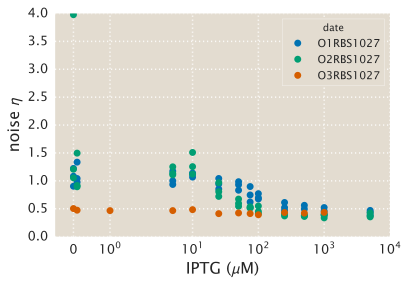

In [9]:
df_group = df_noise.groupby(['operator', 'rbs'])
    
for group, data in df_group:
    plt.plot(data.IPTG_uM, data.noise, lw=0, marker='o',
            label=group[0] + group[1])
plt.xscale('symlog')
plt.xlabel('IPTG ($\mu$M)')
plt.ylabel('noise $\eta$')
plt.legend(title='date')
plt.xlim(left=-5E-1)

At first sight there is not a clear trend in the noise.

Let's find the value of the parameter that satisfies this mean noise level. For this we will use the `scipy.optimize.root` function.

In [21]:
prot_params = dict(ka=139.55, ki=0.53, epsilon=4.5,
                   gamma_m=0.00284, r_gamma_m=15.7,
                   gamma_p=0.000277, r_gamma_p=100, rep=2 * 130 * 1.66)

def root_fn(k0, df, prot_params):
    '''
    function to find the root that satisfies the mean noise level
    '''
    prot_params['k0'] = k0
    prot_params['kon'] = chann_cap.kon_fn(-13.9, k0)
    # Group by date and concentration
    noise_group = df.groupby(['date','IPTG_uM'])
    
    residuals = []
    # Loop through groups returning the residuals
    for group, data in noise_group:
        # Compute experimental noise
        avg_noise = data.noise
        residuals.append(np.array(noise_protein(group[1], **prot_params) -\
                                  avg_noise))
        
    return np.array(residuals).ravel()

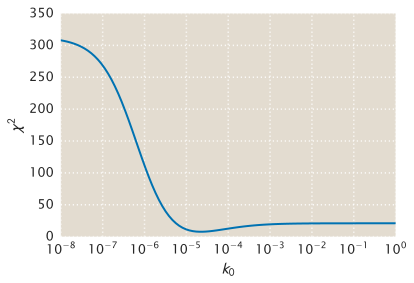

In [22]:
# Let's plot the sum of the square of the residuals as a function of different
# selections of the k0 parameter.
k0_array = np.logspace(-8, 0, 100)
df = df_noise[(df_noise.operator=='O2') & (df_noise.rbs=='RBS1027')]
plt.plot(k0_array, [np.sum(root_fn(ko, df, prot_params)**2) for ko in k0_array])
plt.xlabel(r'$k_0$')
plt.xscale('log')
plt.ylabel(r'$\chi^2$')

It seems that the ideal parameter is around $5 \times 10^{-5}$. Let's find the actual parameter value using the `scipy.optimize.least_squares` function.

In [23]:
sol = scipy.optimize.least_squares(root_fn, 5E-5, args=(df, prot_params))
k0_fit = sol.x[0]
print('k0 = {:.7f}'.format(k0_fit))

k0 = 0.0000222


###  Testing this parameter fit with all the data.

Having obtained a value for the $k_0$ parameter let's see how well it predicts the noise from different strains.

In [24]:
# Define the IPTG concentrations to evaluate the theoretical noise
IPTG = np.logspace(-1, 4, 100)

# Define a dictionary that contains relevant parameters
energies = {'O1':-15.3, 'O2':-13.9, 'O3':-9.7, 'Oid':-17}
rbs = np.array(['RBS1L', 'RBS1', 'RBS1027', 'RBS446', 'RBS1147', 'HG104'])
repressors = dict(zip(rbs,[870, 610, 130, 62, 30, 11]))

# Define the CME parameters
prot_params = dict(ka=139.55, ki=0.53, epsilon=4.5,
                   gamma_m=0.00284, r_gamma_m=15.7,
                   gamma_p=0.000277, r_gamma_p=100,
                   k0=k0_fit)

(-0.5, 10000.0)

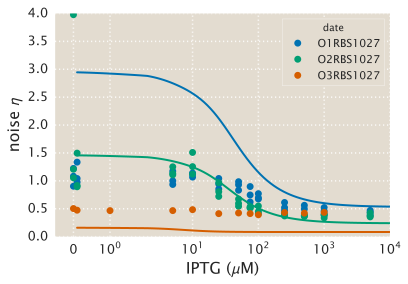

In [25]:
# Group by operator and rbs
df_group = df_noise.groupby(['operator', 'rbs'])

colors = sns.color_palette('colorblind', n_colors=len(df_group))
i = 0
for group, data in df_group:
    # Compute the kon based on Hernan's binding energy and the k0 value
    prot_params['kon'] = chann_cap.kon_fn(epsilon=energies[group[0]],
                                         k0=prot_params['k0'])
    # Indicate the repressor copy number
    prot_params['rep'] = repressors[group[1]] * 1.66 * 2
    # Compute the theoretical noise for different IPTG concentrations
    noise_thry = noise_protein(C=IPTG, **prot_params)
    # Plot the theoretical noise
    plt.plot(IPTG, noise_thry, color=colors[i])
    # Polot the experimental noise
    plt.plot(data.IPTG_uM, data.noise, lw=0, marker='o',
            label=group[0] + group[1], color=colors[i])
    i+=1
plt.xscale('symlog')
plt.xlabel('IPTG ($\mu$M)')
plt.ylabel('noise $\eta$')
plt.legend(title='date')
plt.xlim(left=-5E-1)

##  Fitting the parameter to all of the available data.

A different approach to find the best fit parameter is to use all of the available data rather than a single strain. Let's see how different the value would be.

In [26]:
prot_params = dict(ka=139.55, ki=0.53, epsilon=4.5,
                   gamma_m=0.00284, r_gamma_m=15.7,
                   gamma_p=0.000277, r_gamma_p=100)

# Define a dictionary that contains relevant parameters
energies = {'O1':-15.3, 'O2':-13.9, 'O3':-9.7, 'Oid':-17}
rbs = np.array(['RBS1L', 'RBS1', 'RBS1027', 'RBS446', 'RBS1147', 'HG104'])
repressors = dict(zip(rbs,[870, 610, 130, 62, 30, 11]))


def root_fn(k0, df, prot_params):
    '''
    function to find the root that satisfies the mean noise level
    '''
    prot_params['k0'] = k0
    # Group by date and concentration
    noise_group = df.groupby(['date','IPTG_uM'])
    
    residuals = []
    # Loop through groups returning the residuals
    for group, data in noise_group:
        # Compute the k0 parameter based on the energy
        energy = energies[data.operator.unique()[0]]
        prot_params['kon'] = chann_cap.kon_fn(energy, k0)
        # Get the number of repressors from the RBS
        prot_params['rep'] = repressors[data.rbs.unique()[0]] * 2 * 1.66
        # Compute experimental noise
        avg_noise = data.noise
        residuals.append(np.array(noise_protein(group[1], **prot_params) -\
                                  avg_noise))
        
    return np.array(residuals).ravel()

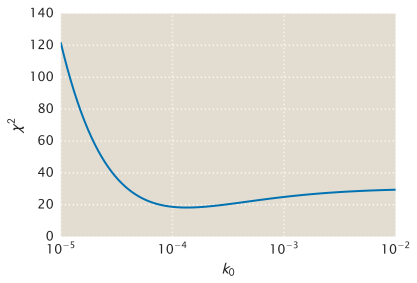

In [27]:
# Let's plot the sum of the square of the residuals as a function of different
# selections of the k0 parameter.
k0_array = np.logspace(-5, -2, 100)
df = df_noise[(df_noise.rbs!='auto') & (df_noise.rbs!='delta')]
plt.plot(k0_array, [np.sum(root_fn(ko, df, prot_params)**2) for ko in k0_array])
plt.xlabel(r'$k_0$')
plt.xscale('log')
plt.ylabel(r'$\chi^2$')

In [28]:
sol = scipy.optimize.least_squares(root_fn, 1E-4, args=(df, prot_params))
k0_global_fit = sol.x[0]
print('k0 = {:.7f}'.format(k0_global_fit))

k0 = 0.0001347


In [29]:
# Define the IPTG concentrations to evaluate the theoretical noise
IPTG = np.logspace(-1, 4, 200)

# Define the CME parameters
prot_params = dict(ka=139.55, ki=0.53, epsilon=4.5,
                   gamma_m=0.00284, r_gamma_m=15.7,
                   gamma_p=0.000277, r_gamma_p=100,
                   k0=k0_global_fit)

(-0.5, 10000.0)

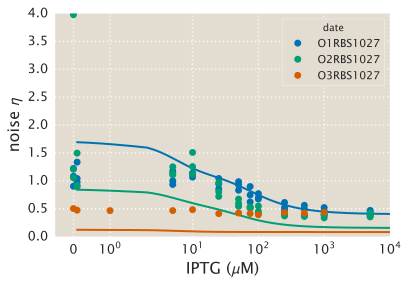

In [30]:
# Group by operator and rbs
df_group = df_noise.groupby(['operator', 'rbs'])

colors = sns.color_palette('colorblind', n_colors=len(df_group))
i = 0
for group, data in df_group:
    # Compute the kon based on Hernan's binding energy and the k0 value
    prot_params['kon'] = chann_cap.kon_fn(epsilon=energies[group[0]],
                                         k0=prot_params['k0'])
    # Indicate the repressor copy number
    prot_params['rep'] = repressors[group[1]] * 1.66 * 2
    # Compute the theoretical noise for different IPTG concentrations
    noise_thry = noise_protein(C=IPTG, **prot_params)
    # Plot the theoretical noise
    plt.plot(IPTG, noise_thry, color=colors[i])
    # Polot the experimental noise
    plt.plot(data.IPTG_uM, data.noise, lw=0, marker='o',
            label=group[0] + group[1], color=colors[i])
    i+=1
plt.xscale('symlog')
plt.xlabel('IPTG ($\mu$M)')
plt.ylabel('noise $\eta$')
plt.legend(title='date')
plt.xlim(left=-5E-1)

#  